In [1]:
import pandas as pd

KernelInterrupted: Execution interrupted by the Jupyter kernel.

KernelInterrupted: Execution interrupted by the Jupyter kernel.

In [2]:
df = pd.read_csv('PaysComplet.csv')
df


,Unnamed: 0,Unnamed: 0.1,Nom,Artiste,Genre,Annee,Paroles,Pays
0,0,0,As It Was,Harry Styles,pop,2022,[Intro] Come on Harry we wanna say goodn...,United Kingdom
1,1,1,Heat Waves,Glass Animals,pop,2022,[Intro] (Last night all I think about is y...,United Kingdom
2,2,2,STAY (with Justin Bieber),The Kid LAROI,hip hop,2022,[Chorus: The Kid LAROI] I do the same thing ...,Australia
3,3,3,Me Porto Bonito,Bad Bunny,reggae,2022,"[Letra de ""Me Porto Bonito""] [Intro: Bad ...",United States
4,4,4,Tití Me Preguntó,Bad Bunny,reggae,2022,"[Letra de ""Tití Me Preguntó""] [Intro: Bad...",United States
...,...,...,...,...,...,...,...,...
2445,2445,2445,Maria Maria (feat. The Product G&B),Santana,rock,2000,[Intro: Wyclef Jean] Ladies and gents turn...,United States
2446,2446,2446,Incomplete,Sisqo,r&b,2000,[Intro] Ooh-ooh ooh-ooh ooh Oh yeah ye...,United States
2447,2447,2447,Country Grammar (Hot Shit),Nelly,pop,2000,Unknown,United States
2448,2448,2448,"Jumpin', Jumpin'",Destiny's Child,pop,2000,Unknown,United States


In [3]:
import plotly.express as px

# Obtenir les 10 artistes avec le plus de chansons
top_artists = df['Artiste'].value_counts().nlargest(20)

# Créer un DataFrame pour les données des 10 meilleurs artistes
top_artists_df = pd.DataFrame({'Artiste': top_artists.index, 'Nombre de Chansons': top_artists.values})

# Créer un graphique à barres avec différentes couleurs pour chaque artiste
fig = px.bar(top_artists_df, x='Artiste', y='Nombre de Chansons', color='Artiste',
             title='Top 20 des artistes avec le plus de chansons')
fig.show()


### Les Genres :

In [4]:
genre_counts = df['Genre'].value_counts()
fig = px.pie(values=genre_counts, names=genre_counts.index, title='Répartition des genres musicaux')
fig.show()

En analysant le diagramme, on peut noter que la catégorie **"Pop"** représente la plus grande part avec environ **60%** de la répartition totale des genres musicaux. Cela indique que la musique pop est le genre le plus représenté dans l'ensemble de données étudié.

Ensuite, on observe que le genre **"Hip Hop"** occupe la deuxième place en termes de pourcentage, avec environ **9,84%**. Bien que moins répandu que la musique pop, le hip-hop reste un genre musical significatif dans l'ensemble de données.

Le troisième genre le plus fréquent est le **"Rock"**, qui représente environ **6,61%** de la répartition totale. Bien que sa part soit inférieure à celle du pop et du hip-hop, le rock reste un genre musical important dans l'ensemble de données.

Ces observations soulignent les genres musicaux les plus prédominants dans l'ensemble de données, avec la musique pop en tête suivie du hip-hop et du rock. Il est important de noter que les autres genres ne sont pas explicitement mentionnés dans la description, mais ils contribuent au reste de la répartition.

In [5]:

# Créer une matrice de corrélation entre les années et les pays
year_country_corr = df.pivot_table(index='Annee', columns='Genre', values='Nom', aggfunc='count').fillna(0)

fig = px.imshow(year_country_corr, x=year_country_corr.columns, y=year_country_corr.index,
                color_continuous_scale='Blues', title='Corrélation entre les années et les Genres')
fig.show()



Grâce à ce graphe on peut voir les années où certains genres musicaux ont été le plus présent ou pas.

In [6]:
fig = px.scatter(df, x='Annee', y='Genre', title='Année de sortie et apparition des genres dans le Top', color='Genre')
fig.show()


On arrive à voir les genres qui ont été présent dans le Top 100 au cours des années.

### Pays :

In [7]:

top_10_pays = df['Pays'].value_counts().nlargest(10)
fig = px.bar(x=top_10_pays.index, y=top_10_pays.values, title='Top 10 des pays par nombre de chansons',
             color=top_10_pays.index, color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_layout(xaxis_title='Pays', yaxis_title='Nombre de chansons dans le top')
fig.show()


### Paroles :

 Le nuage de mots suivant affiche les mots les plus fréquents dans les paroles de chansons pour chaque pays. Cela permet d'obtenir une vue d'ensemble des termes les plus utilisés et de leur importance relative. Les mots les plus fréquents apparaissent en plus grand dans le nuage de mots, tandis que les mots moins fréquents apparaissent en plus petit.

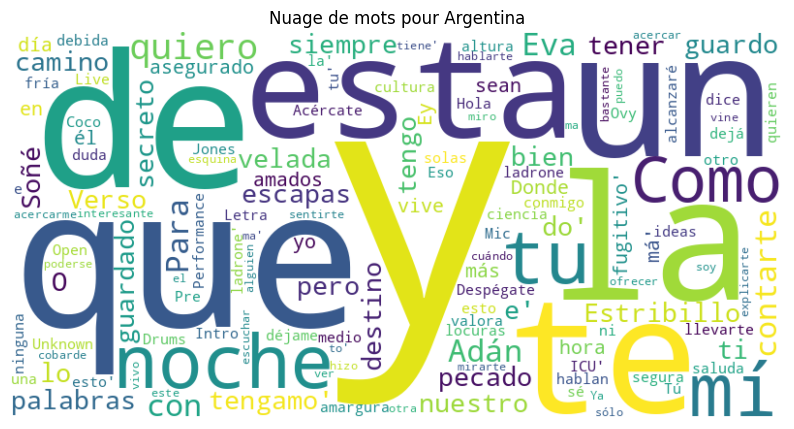

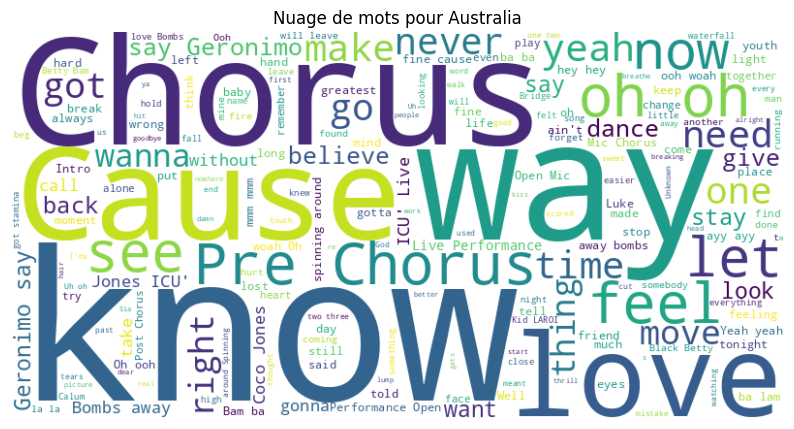

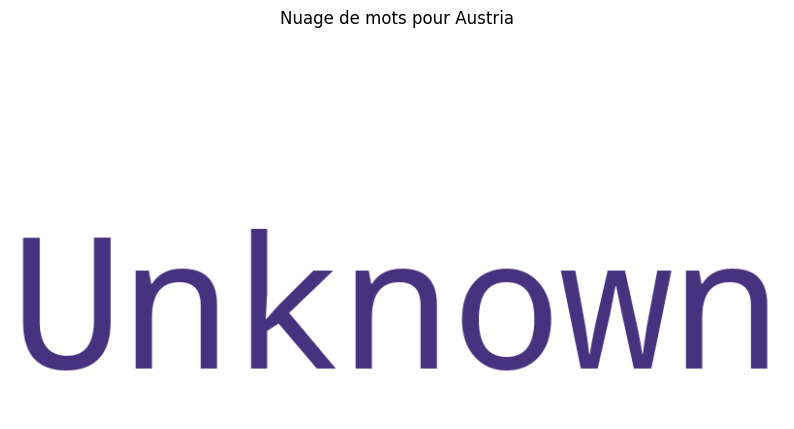

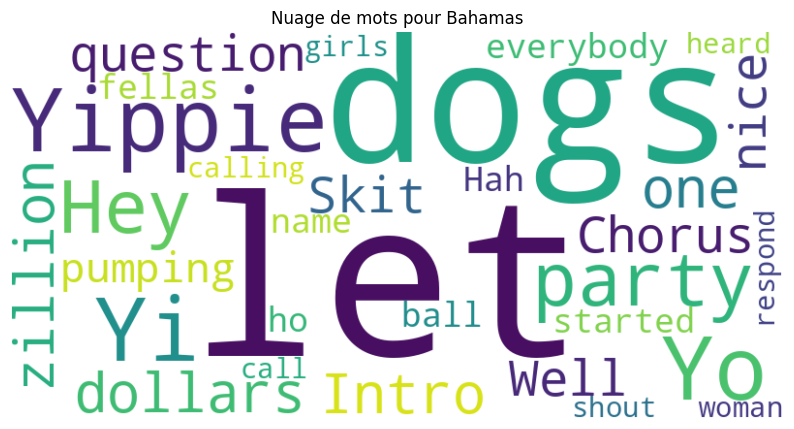

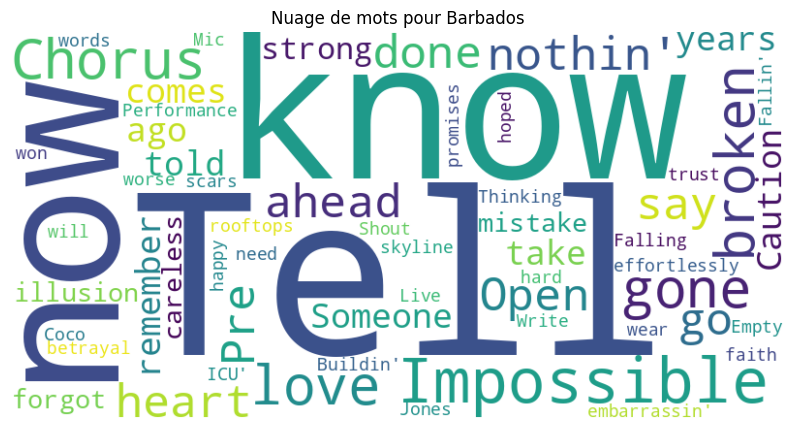

...

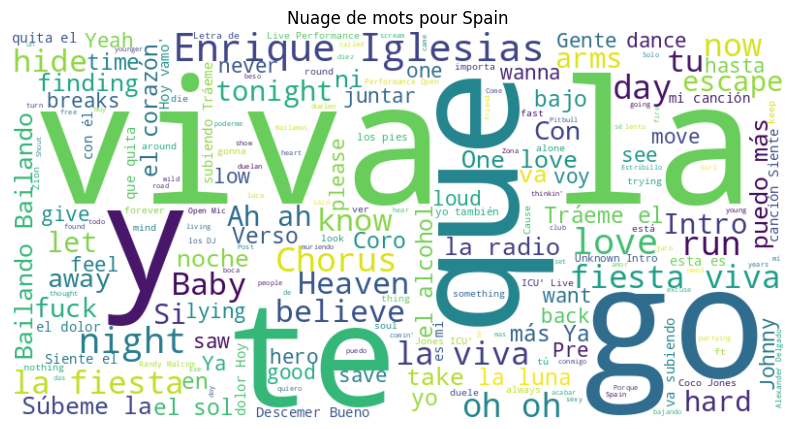

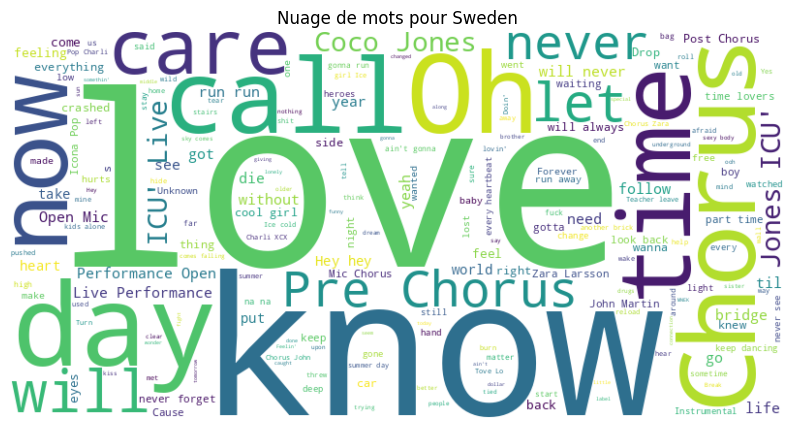

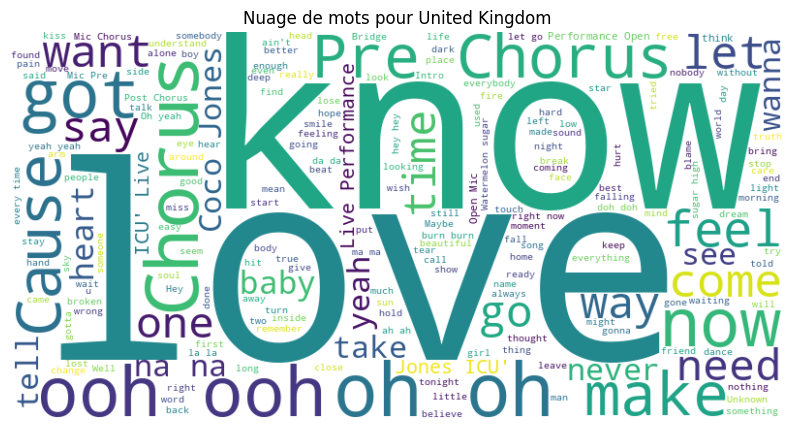

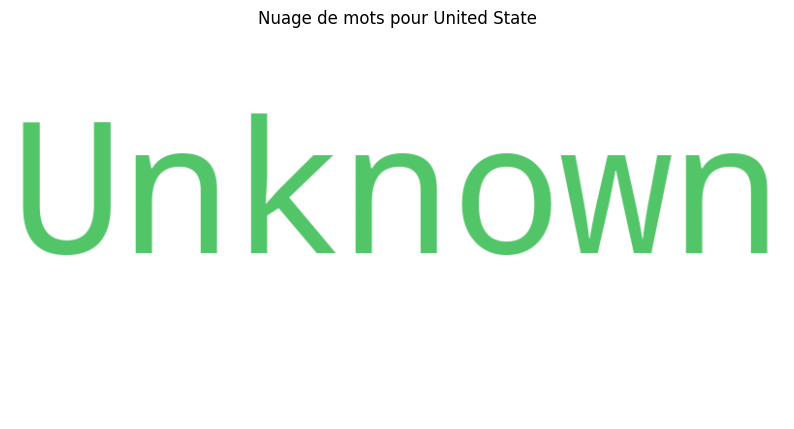

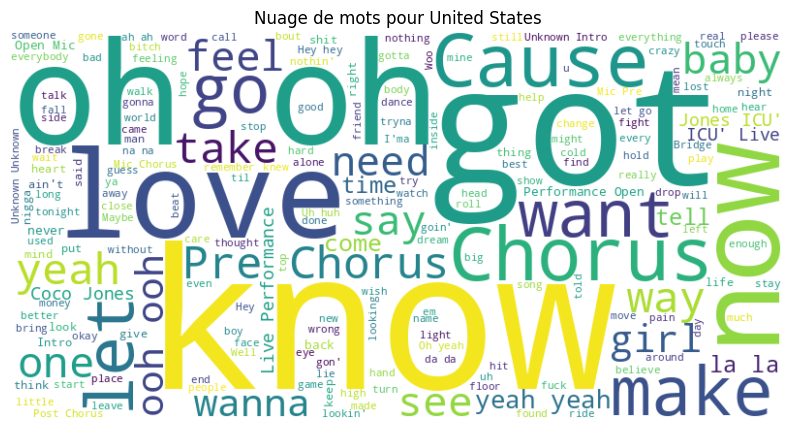

In [8]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re

# Regroupe les paroles par pays
lyrics_by_country = df.groupby('Pays')['Paroles'].apply(lambda x: ' '.join(x)).reset_index()

# un nuage de mots pour chaque pays
for index, row in lyrics_by_country.iterrows():
    country = row['Pays']
    lyrics = row['Paroles']
    
    # Retirer le mot "Verse" des paroles
    lyrics = re.sub(r'\bVerse\b', '', lyrics)
    
    #  nuage de mots
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(lyrics)
    
    # Affichage du nuage de mots
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Nuage de mots pour {country}')
    plt.axis('off')
    plt.show()


In [9]:
fig = px.histogram(df, x='Annee', color='Genre', facet_col='Genre',
                   title='Évolution du nombre de chansons par année et par genre')
fig.update_layout(barmode='stack')
fig.show()


### Carte sur l'évolution des pays qui produisent le plus de sons dans le Top 100 chaque année :

In [10]:
df_grouped = df.groupby(['Annee', 'Pays']).size().reset_index(name='Nombre de Chansons')
import plotly.express as px

fig = px.scatter_geo(df_grouped, locations='Pays', locationmode='country names',
                     color='Pays', size='Nombre de Chansons',
                     projection='natural earth', hover_name='Pays',
                     animation_frame='Annee', title='Évolution de la localisation des chansons')

fig.show()


KernelInterrupted: Execution interrupted by the Jupyter kernel.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=73a2d827-cb40-472a-ae56-dc40ef4b18bd' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>